In [1]:
from lane_lines.nb_start import *
%load_ext autoreload
%autoreload 2
%matplotlib inline
#from klearn.nb_start import *
%config InlineBackend.figure_format = 'retina'

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
from PIL import Image

#### 1. distortion correction via camera calibration

In [2]:
chessboard_paths = sorted(glob.glob('camera_cal/calibration*.jpg'))
path = chessboard_paths[0]

In [3]:
nx = 9
ny = 6

In [4]:
#objp

In [5]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
show_corners = False

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
dsts = {}

# Step through the list and search for chessboard corners
for fname in chessboard_paths:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        if show_corners:
            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            plt.imshow(img)
            


In [6]:
 ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [7]:
def undistort(fname, objpoints, imgpoints):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst, mtx, dist


In [8]:
def plot_undistorted(path):
    img = cv2.imread(path)
    undistorted, _, _ = undistort(path, objpoints, imgpoints)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    plt.savefig('examples/undistort_output.png')
    plt.show()

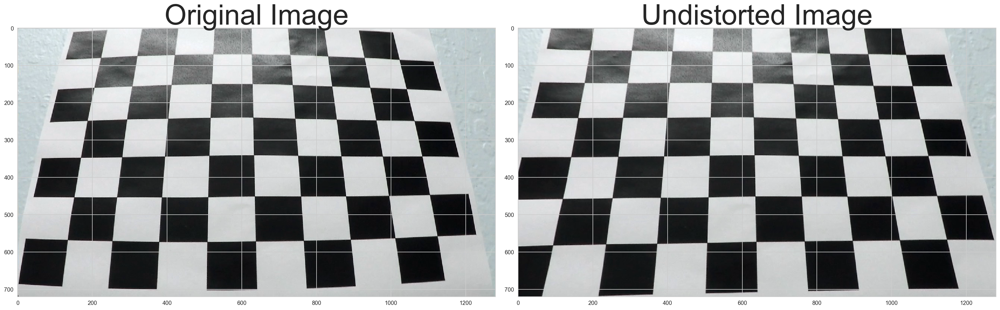

In [9]:
plot_undistorted('camera_cal/calibration3.jpg')

In [10]:
dist, mtx, dist = undistort('camera_cal/calibration3.jpg', objpoints, imgpoints)

In [11]:
def rgb_read(path):
    srcBGR = cv2.imread(path)
    return cv2.cvtColor(srcBGR, cv2.COLOR_BGR2RGB)

def undistort_and_hls(image, mtx=mtx, dist=dist):
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    hls = cv2.cvtColor(undist, cv2.COLOR_BGR2HLS)
    return hls

def get_s_channel(image, mtx=mtx, dist=dist):
    return undistort_and_hls(image, mtx, dist)[:,:,2]

In [12]:
test_paths = glob.glob('./test_images/*.jpg')
test_images =  list(map(rgb_read, test_paths ))

In [13]:
from lane_lines.viz import plot_side_by_side
def plot_gray(img, cmap='gray'):
    fig, axes = plt.subplots(ncols=1, figsize=(10,10))
    #for index, a in enumerate(axes):
    axes.imshow(img, cmap='gray')
    axes.axis('off')
    return axes

In [17]:
from lane_lines.sobel_utils import get_threshd_image

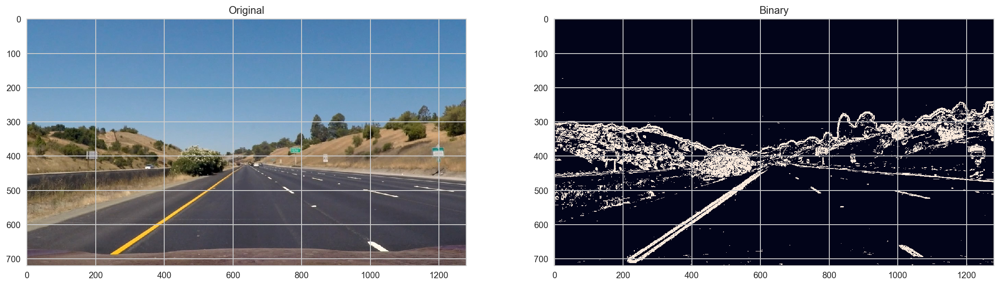

In [18]:
new = get_threshd_image(test_images[0])
plot_side_by_side(test_images[0], 'Original', new, 'Binary')
plt.savefig('./examples/binary_combo_example.jpg')

In [19]:
new = cv2.undistort(test_images[0], mtx, dist, None, mtx)


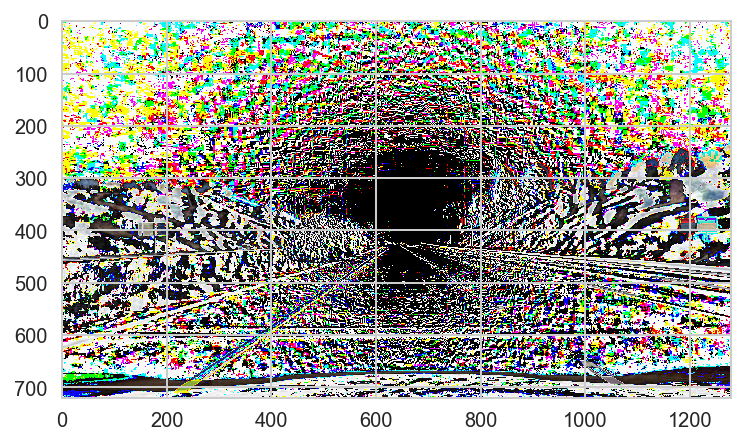

In [20]:
plt.imshow((test_images[0] - new))

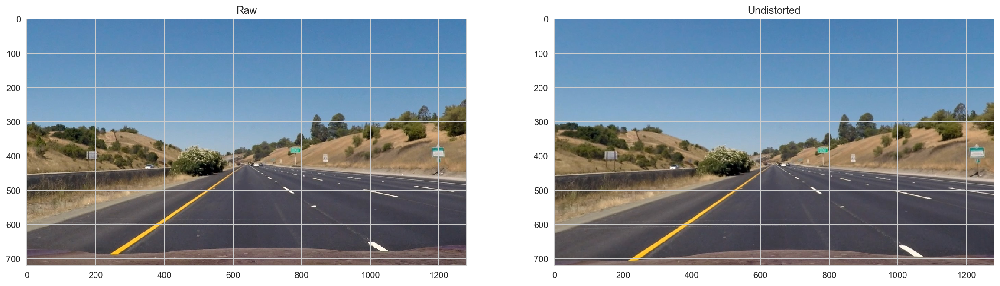

In [21]:
plot_side_by_side(test_images[0], 'Raw', new, 'Undistorted')
plt.savefig('examples/undistort_output1.jpg')

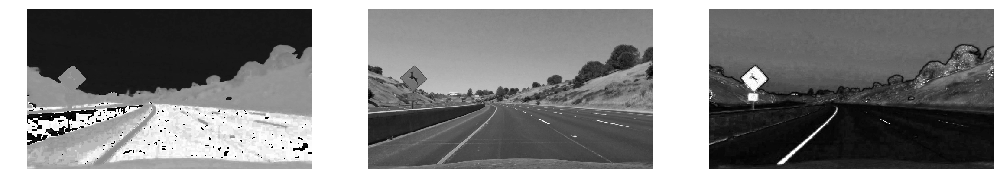

In [234]:
hls_img = undistort_and_hls(rgb_read(test_paths[3]))
fig, axes = plt.subplots(ncols=3, figsize=(20,10))
for index, a in enumerate(axes):
    a.imshow(hls_img[:,:,index], cmap='gray')
    a.axis('off')

In [235]:
from lane_lines.sobel_utils import get_threshd_image

### Apply a perspective transform to rectify binary image ("birds-eye view").

 Identify four source points (assume road is flat plane) in a trapezoidal shape that would be a rectangle from bird's eye.
 
 Need to get `M` and `Minv` from one hand labeled trapezoid

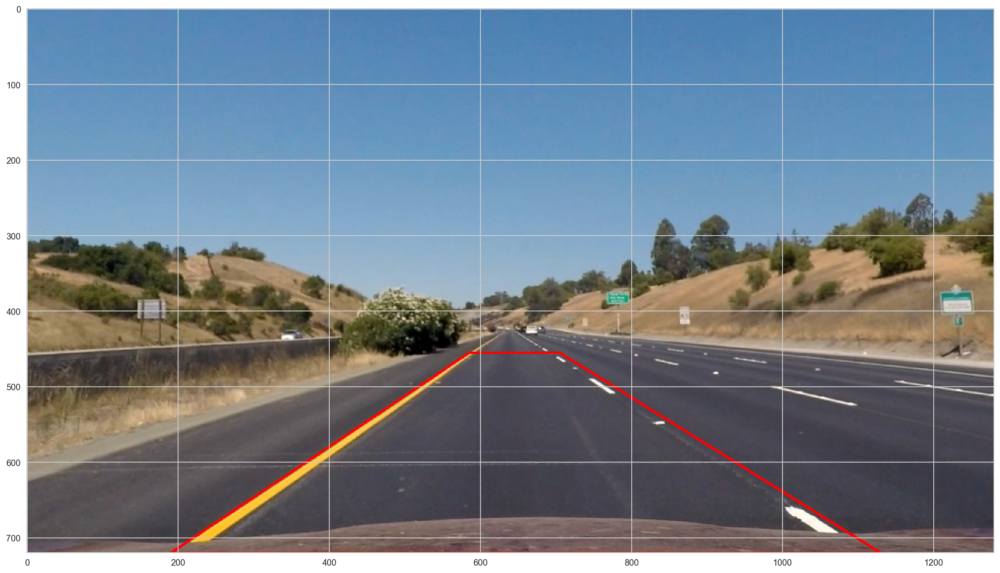

In [236]:
undist = cv2.undistort(img, mtx, dist, None, mtx)

xSize, ySize, _ = undist.shape
copy = undist.copy()

bottomY = 720
topY = 455


trap_corners = [(190, 720), (705, 455), (585, 455), (1130, 720)]
left1, right1, left2, right2 = trap_corners
# draw trapezoid on copy
color = [255, 0, 0]
w = 2
cv2.line(copy, left1, left2, color, w)
cv2.line(copy, left2, right1, color, w)
cv2.line(copy, right1, right2, color, w)
cv2.line(copy, right2, left1, color, w)
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(copy)

In [25]:
src = np.float32([left2, right1, right2, left1])
nx = gray.shape[1]
ny = gray.shape[0]
img_size = (nx, ny)
dest = np.float32([[200, 0],
               [nx-200, 0],
               [nx-200, ny],
               [200, ny]])

In [26]:
M = cv2.getPerspectiveTransform(src, dest)
Minv = cv2.getPerspectiveTransform(dest, src)

In [27]:

def warp(img):
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size)
    return warped

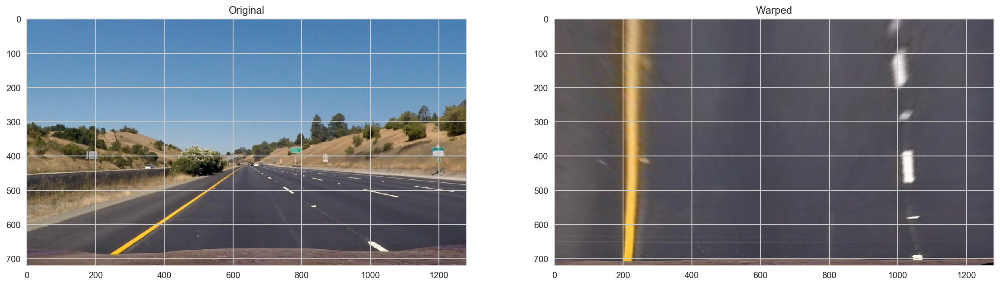

In [28]:
plot_side_by_side(test_images[0], 'Original', warp(test_images[0]), 'Warped')
plt.savefig('examples/warped_straight_lines.jpg')

### Detect lane pixels and fit to find the lane boundary.

./test_images/test1.jpg


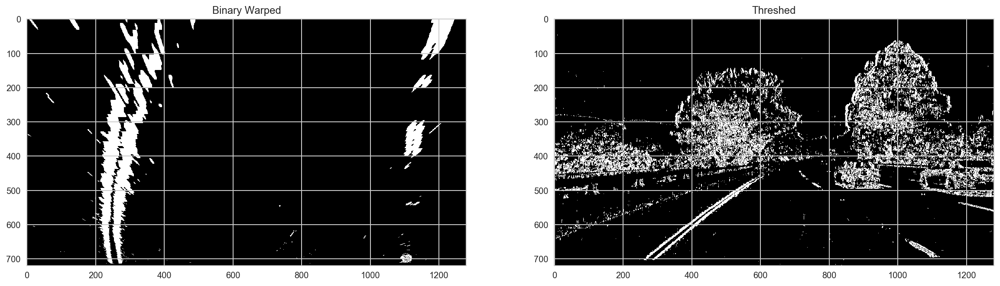

In [233]:
path = test_paths[2]

img = cv2.imread(path)
threshed = get_threshd_image(img)
binary_warped = warp(threshed)
print(path)

plot_side_by_side(binary_warped, 'Binary Warped', threshed, 'Threshed', leftCmap='gray', rightCmap='gray')

### Other Images for writeup

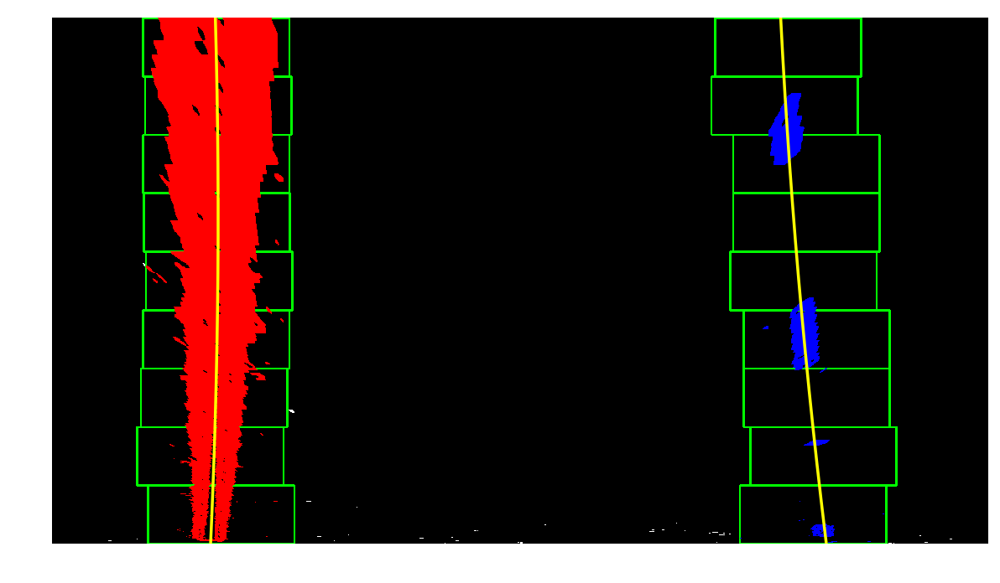

In [32]:
def show_diagnostic(big_tuple, img):
    (left_fit, right_fit,
            left_curverad, right_curverad, offset,
            left_lane_inds, right_lane_inds,
            out_img,  nonzerox, nonzeroy) = big_tuple
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    ax = plot_gray(out_img, cmap=None)
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')
    return ax
ax = show_diagnostic(big_tuple, img)
plt.savefig('examples/color_fit_lines.jpg')
plt.show()

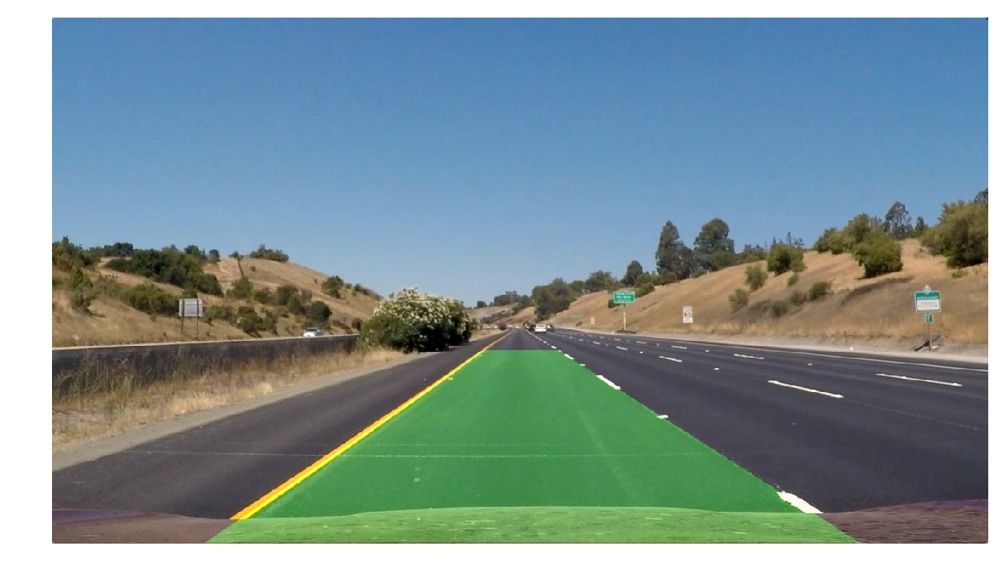

In [33]:
plot_gray(output, cmap=None)
plt.savefig('examples/example_output.jpg')

###  Video

In [34]:
from lane_lines.video import video_pipeline, show_diagnostic

In [35]:
from moviepy.editor import VideoFileClip, ImageSequenceClip

In [36]:
 clip = VideoFileClip('project_video.mp4')

In [232]:
%%time
c1= video_pipeline(clip)
c0, diag = c1

c2= ImageSequenceClip(c0, fps=25)
c2.write_videofile('my_project_video.mp4')
!open my_project_video.mp4

[MoviePy] >>>> Building video my_project_video.mp4
[MoviePy] Writing video my_project_video.mp4


100%|██████████| 1260/1260 [00:22<00:00, 55.86it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: my_project_video.mp4 

CPU times: user 3min 24s, sys: 39 s, total: 4min 3s
Wall time: 3min 9s


# Scrap/ Debugging

In [122]:
def debug_curve(bug):
    binary_warped = warp(get_threshd_image(bug, y_min=160))
    (left_fit, right_fit,
            left_curverad, right_curverad, offset,
            left_lane_inds, right_lane_inds,
            out_img,  nonzerox, nonzeroy, left_fit_cr, right_fit_cr) = fit_poly(binary_warped)
    output = draw_line(bug, left_fit, right_fit, Minv)
    print(left_curverad, right_curverad, offset)
    _put_text(output, 'Left curvature: {:.0f} m'.format(left_curverad),
          50)
    _put_text(output, 'Right curvature: {:.0f} m'.format(right_curverad),
          100)
    _put_text(output, 'Vehicle is {:.2f}M right of center'.format(offset),
          150)
    two_plot(output, binary_warped)
def get_stats(bug):
    binary_warped = warp(get_threshd_image(bug, y_min=160))
    (left_fit, right_fit,
            left_curverad, right_curverad, offset,
            left_lane_inds, right_lane_inds,
            out_img,  nonzerox, nonzeroy, left_fit_cr, right_fit_cr) = fit_poly(binary_warped)
    #output = draw_line(bug, left_fit, right_fit, Minv)
    return (left_curverad, right_curverad, offset)
stats = pd.DataFrame([get_stats(bug) for bug in test_images])

In [40]:
d1= ImageSequenceClip(diag, fps=25)

In [ ]:
c2 = ImageSequenceClip(c0, fps=10)

In [ ]:
from lane_lines.fit_poly import warp
from lane_lines.sobel_utils import get_threshd_image

In [ ]:
bug_raw = clip.get_frame(1.7)

In [ ]:
get_threshd_image(c0[13])

In [ ]:
c2.write_videofile('bug.mp4')

In [ ]:
d1.write_videofile('bug_diag.mp4')

In [ ]:
paths = ['challenge_video.mp4', 'harder_challenge_video.mp4',
         'project_video.mp4']
for p in paths[1:]:
    print(p)
    clip = VideoFileClip(p)
    c1, _ = video_pipeline(clip)
    new_path = os.path.join('video_output/', p)
    c2 = ImageSequenceClip(c1, fps=10)
    c2.write_videofile('my_'+p, audio=False, fps=10)

In [ ]:
!open my_challenge_video.mp4

ls video_output

In [ ]:

c2.write_videofile('my_project_video_end.mp4', audio=False,
                  )

In [ ]:
plt.imshow(c2[0])

In [ ]:
plt.imshow(c2[-1])

In [ ]:
%%capture
clp = ImageSequenceClip(c2, fps=10)


In [ ]:
plt.imshow(clp.get_frame(1))

In [ ]:
clp.write_gif('test.gif')

In [ ]:
!open test.gif

In [ ]:
!open test.mp4

In [52]:
from lane_lines.viz import plot_side_by_side

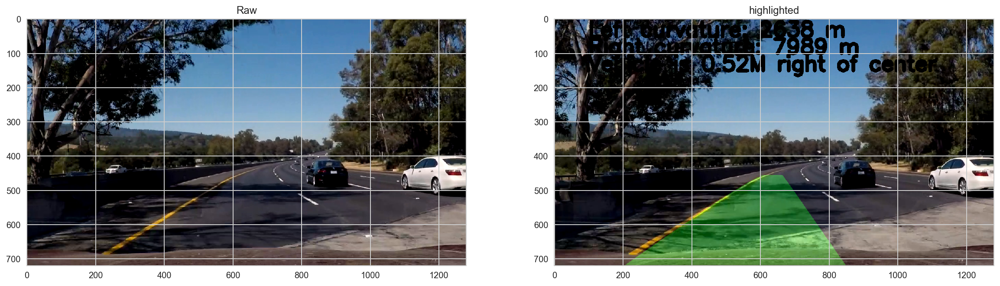

In [71]:
k = 41.55
plot_side_by_side(clip.get_frame(k), 'Raw',
                  c2.get_frame(k), 'highlighted')

In [72]:
bug = clip.get_frame(k)

In [76]:
img = Image.fromarray(bug)

In [77]:
import scipy.misc
scipy.misc.imsave('bug.jpg', bug)

In [88]:
def two_plot(l, r):
    return plot_side_by_side(l, "Raw", r, 'Transformed')

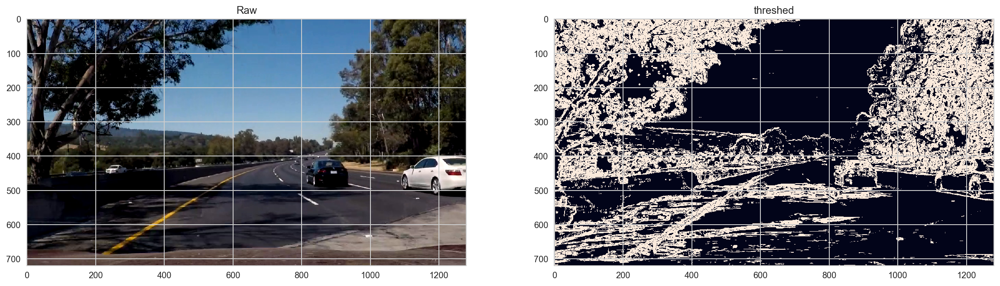

In [86]:
plot_side_by_side(bug, 'Raw', get_threshd_image(bug), 'threshed')

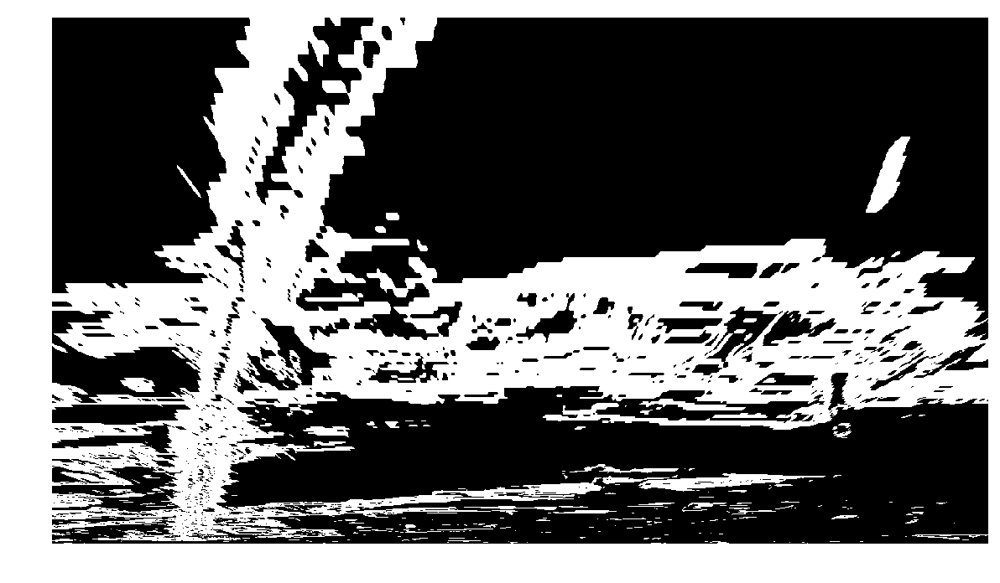

In [84]:
plot_gray(warp(get_threshd_image(bug)))

In [92]:
bug.shape

(720, 1280, 3)

In [61]:
c2.write_videofile('cur_video.mp4')

[MoviePy] >>>> Building video cur_video.mp4
[MoviePy] Writing video cur_video.mp4


100%|██████████| 1260/1260 [00:19<00:00, 64.06it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: cur_video.mp4 



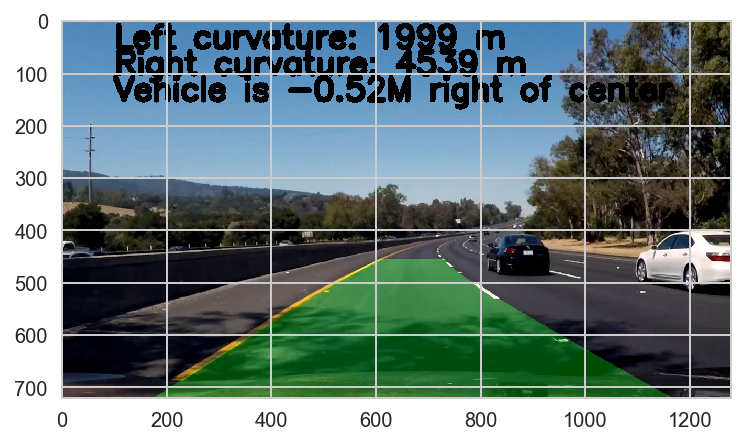

In [50]:
plt.imshow(

In [45]:
c2.ipython_display()

100%|██████████| 1260/1260 [00:11<00:00, 105.39it/s]
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [ ]:
plt.imshow(clip.get_frame(11))

In [ ]:
#process_image(imgs[0])

In [ ]:
imgs = []
for i, k in enumerate(clip.iter_frames()):
    print(i)
    if i > 10:
        imgs.append(k)
        plt.imshow(k)
        plt.show()
    if i > 13:
        break

In [ ]:
for i, k in enumerate(c2.iter_frames()):
    print(i)
    if i > 10:
        plt.imshow(k)
        plt.show()
    if i > 13:
        break

In [ ]:
from moviepy.editor import VideoFileClip, ImageSequenceClip


In [ ]:
from lane_lines.fit_poly import get_offset

In [ ]:
get_offset(img, left_fit_m, right_fit_m)

In [ ]:
right_line_loc = predict_poly(right_fit_m, img.shape[1] * xm_per_pix)

In [ ]:
def predict_poly(coeffs, val):
    return coeffs[0] * val**2 + coeffs[1] * val + coeffs[2]

In [ ]:
#output = draw_lane_on_image(test_paths[-1], Minv);plot_gray(output, cmap=None)

In [ ]:
output.shape

In [ ]:

left_fit_m[-1]

In [ ]:
right_fit_m[-1]

In [ ]:
def get_curvature(a, b, y):
    numer = (1 + (2*a*y+b)**2)**1.5
    denom = np.abs(2*a)
    return numer/ denom



# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m

In [ ]:
get_curvature(left_fit[0], left_fit[1], img.shape[0])

In [ ]:
 ploty = np.linspace(0, binary_warped.shape[0]-1, 
                     binary_warped.shape[0] )

In [ ]:
y_eval = np.max(ploty)

In [ ]:
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)
# Example values: 1926.74 1908.48